# Company Bankrupcy Prediction using Machine  Learning Algorithm
#                                              Submitted by- Indrajith S.


 ### Objective for this Dataset:
  we will use various predictive models to see how accurate,they are in detecting whether we can correctly predict 
          which comapnies will face bankrptcy or not.

###### Importing neccessary libraries for this project

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import imblearn
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
import xgboost as XGB
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import roc_auc_score, roc_curve, auc, accuracy_score
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold

%matplotlib inline
sns.set()
import warnings
warnings.filterwarnings('ignore')

pd.set_option("display.max_colwidth", 100)
pd.set_option("display.max_rows", 100)
pd.set_option("display.max_columns", 100)

In [2]:
bank_df = pd.read_csv("BANKRUPTCY PREDICTION .csv")

Removed extra spaces from column names as When worked without removing spaces there are some confussion in 
column name so,I removed the extra spces


In [3]:
bank_df.rename(columns=lambda x: x.strip(), inplace=True)
bank_df.head()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan �,Operating Profit Per Share (Yuan �,Per Share Net profit before tax (Yuan �,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256970e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820930e-04,1.165010e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469,1
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897850e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.006889,0.391590,0.012335,0.7

In [4]:
#checked the shaped of the dataset
bank_df.shape

(6819, 95)

# COLUMNS

In [5]:
bank_df.columns.values

array(['ROA(C) before interest and depreciation before interest',
       'ROA(A) before interest and % after tax',
       'ROA(B) before interest and depreciation after tax',
       'Operating Gross Margin', 'Realized Sales Gross Margin',
       'Operating Profit Rate', 'Pre-tax net Interest Rate',
       'After-tax net Interest Rate',
       'Non-industry income and expenditure/revenue',
       'Continuous interest rate (after tax)', 'Operating Expense Rate',
       'Research and development expense rate', 'Cash flow rate',
       'Interest-bearing debt interest rate', 'Tax rate (A)',
       'Net Value Per Share (B)', 'Net Value Per Share (A)',
       'Net Value Per Share (C)',
       'Persistent EPS in the Last Four Seasons', 'Cash Flow Per Share',
       'Revenue Per Share (Yuan �', 'Operating Profit Per Share (Yuan �',
       'Per Share Net profit before tax (Yuan �',
       'Realized Sales Gross Profit Growth Rate',
       'Operating Profit Growth Rate', 'After-tax Net Profit Grow

# EDA

In [6]:
# Descriptive statistics
bank_df.describe()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan �,Operating Profit Per Share (Yuan �,Per Share Net profit before tax (Yuan �,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000
mean,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,1.995347e+09,1.950427e+09,0.467431,1.644801e+07,0.115001,0.190661,0.190633,0.190672,0.22

In [7]:
# check Null values
bank_df.isnull().sum()

ROA(C) before interest and depreciation before interest    0
ROA(A) before interest and % after tax                     0
ROA(B) before interest and depreciation after tax          0
Operating Gross Margin                                     0
Realized Sales Gross Margin                                0
Operating Profit Rate                                      0
Pre-tax net Interest Rate                                  0
After-tax net Interest Rate                                0
Non-industry income and expenditure/revenue                0
Continuous interest rate (after tax)                       0
Operating Expense Rate                                     0
Research and development expense rate                      0
Cash flow rate                                             0
Interest-bearing debt interest rate                        0
Tax rate (A)                                               0
Net Value Per Share (B)                                    0
Net Value Per Share (A) 

### observations:
###### There are no null values

In [8]:
# Checking Nan presence
[print(col) for col in bank_df if bank_df[col].isna().sum() > 0]

[]

In [9]:
# find the uniqueness in the dataset
for i in bank_df.columns:
    print("The no.of unique values in",i,"are: ",bank_df.loc[:,i].nunique())

The no.of unique values in ROA(C) before interest and depreciation before interest are:  3333
The no.of unique values in ROA(A) before interest and % after tax are:  3151
The no.of unique values in ROA(B) before interest and depreciation after tax are:  3160
The no.of unique values in Operating Gross Margin are:  3781
The no.of unique values in Realized Sales Gross Margin are:  3788
The no.of unique values in Operating Profit Rate are:  3376
The no.of unique values in Pre-tax net Interest Rate are:  3789
The no.of unique values in After-tax net Interest Rate are:  3604
The no.of unique values in Non-industry income and expenditure/revenue are:  2551
The no.of unique values in Continuous interest rate (after tax) are:  3617
The no.of unique values in Operating Expense Rate are:  2966
The no.of unique values in Research and development expense rate are:  1536
The no.of unique values in Cash flow rate are:  5557
The no.of unique values in Interest-bearing debt interest rate are:  1080
The

In [10]:
# From above the column name Liability-Assets Flag has uniqueness of 2 lets check the value counts
print(bank_df['Liability-Assets Flag'].value_counts())

Liability-Assets Flag
0    6811
1       8
Name: count, dtype: int64


In [11]:
#As we can drop this column 
bank_df.drop(columns=['Liability-Assets Flag'], inplace=True)


In [12]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 94 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   ROA(C) before interest and depreciation before interest  6819 non-null   float64
 1   ROA(A) before interest and % after tax                   6819 non-null   float64
 2   ROA(B) before interest and depreciation after tax        6819 non-null   float64
 3   Operating Gross Margin                                   6819 non-null   float64
 4   Realized Sales Gross Margin                              6819 non-null   float64
 5   Operating Profit Rate                                    6819 non-null   float64
 6   Pre-tax net Interest Rate                                6819 non-null   float64
 7   After-tax net Interest Rate                              6819 non-null   float64
 8   Non-industry income and expe

#### We can clearly see that except target variable all are in float datatype

In [13]:
bank_df.shape

(6819, 94)

In [14]:
# check for duplicates
bank_df.duplicated().sum()

0

#### There is no duplicate values

In [15]:
# Considering the problem statement,now we have a general overview of our data, we need to focus our attention on the labels
# which are the financially stable and unstable

print(bank_df['Bankrupt'].value_counts())
print('--------------------------------')
print('Financially stable: ', round(bank_df['Bankrupt'].value_counts()[0]/len(bank_df) * 100,2), '% of the dataset')
print('Financially unstable: ', round(bank_df['Bankrupt'].value_counts()[1]/len(bank_df) * 100,2), '% of the dataset')

Bankrupt
0    6599
1     220
Name: count, dtype: int64
--------------------------------
Financially stable:  96.77 % of the dataset
Financially unstable:  3.23 % of the dataset


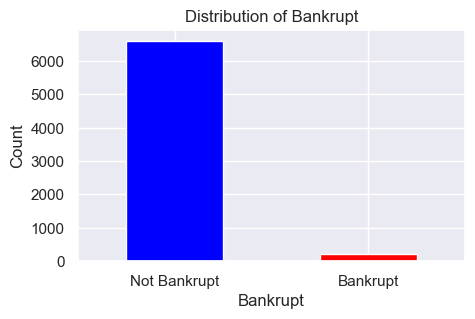

In [16]:
# Checking labels distributions
plt.figure(figsize=(5, 3))
bank_df['Bankrupt'].value_counts().plot(kind='bar', color=['blue', 'red'])
plt.title('Distribution of Bankrupt')
plt.xlabel('Bankrupt')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['Not Bankrupt', 'Bankrupt'], rotation=0)
plt.show()

###### From above graph we observe that this data is Highly Imbalanced as only 3.2% of toal data is of class label 1 (Bankrupt).
###### That is only 220 are class-1 out of 6819 rows and 6599 are class-0
###### So We need to balance our data otherwise, there is a high probability that, Our model may not predict class-1 correctly.

# Correlation Check

In [17]:
bank_df.corr()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan �,Operating Profit Per Share (Yuan �,Per Share Net profit before tax (Yuan �,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt
ROA(C) before interest and depreciation before interest,1.000000,0.940124,0.986849,0.334719,0.332755,0.035725,0.053419,0.049222,0.020501,0.051328,0.066869,0.106461,0.323482,0.048882,0.250761,0.505580,0.505407,0.505281,0.775006,0.379839,-0.015932,0.687201,0.750564,0.000591,0.036511,0.115083,0.115040,0.025234,0.019635,-0.021930,0.079906,0.296158,0.013196,-0.026336,0.003988,-0.022208,-0.261427,0.261427,0.002967,-0.161671,-0.035729,0.685028,0.753339,-0.109888,0.210622,-0.033947,0.007019,-0.062660,-0.065919,0.022896,-0.014834,0.301996,-0.012543,0.259680,0.181993,0.098820,0.235314,-0.010530,-0.046009,-0.210256,0.388151,-0.004447,0.013330,0.052783,0.103819,-0.142734,0.021508,0.650217,0.023450,-0.296019,0.005716,-0.027280,0.001824,-0.029477,0.011759,-0.009192,0.052783,-0.142734,-0.086535,0.262454,0.159699,0.504311,0.129002,-0.160725,0.887670,-0.071725,0.008135,0.334721,0.274287,-0.143629,-0.016575,0.010573,0.052416,-0.260807
ROA(A) before interest and % after tax,0.940124,1.000000,0.955741,0.326969,0.324956,0.032053,0.053518,0.049474,0.029649,0.049909,0.075727,0.084334,0.288440,0.050362,0.225897,0.531799,0.531790,0.531821,0.764828,0.326239,-0.011829,0.654253,0.752578,0.003277,0.042208,0.125384,0.125872,0.024887,0.026977,-0.063970,0.081982,0.263615,0.014102,-0.018412,0.005440,-0.010323,-0.259972,0.259972,0.020707,-0.161868,-0.036183,0.651581,0.758234,-0.078585,0

# Heatmap analysis on columnsfor Correlation

<Axes: >

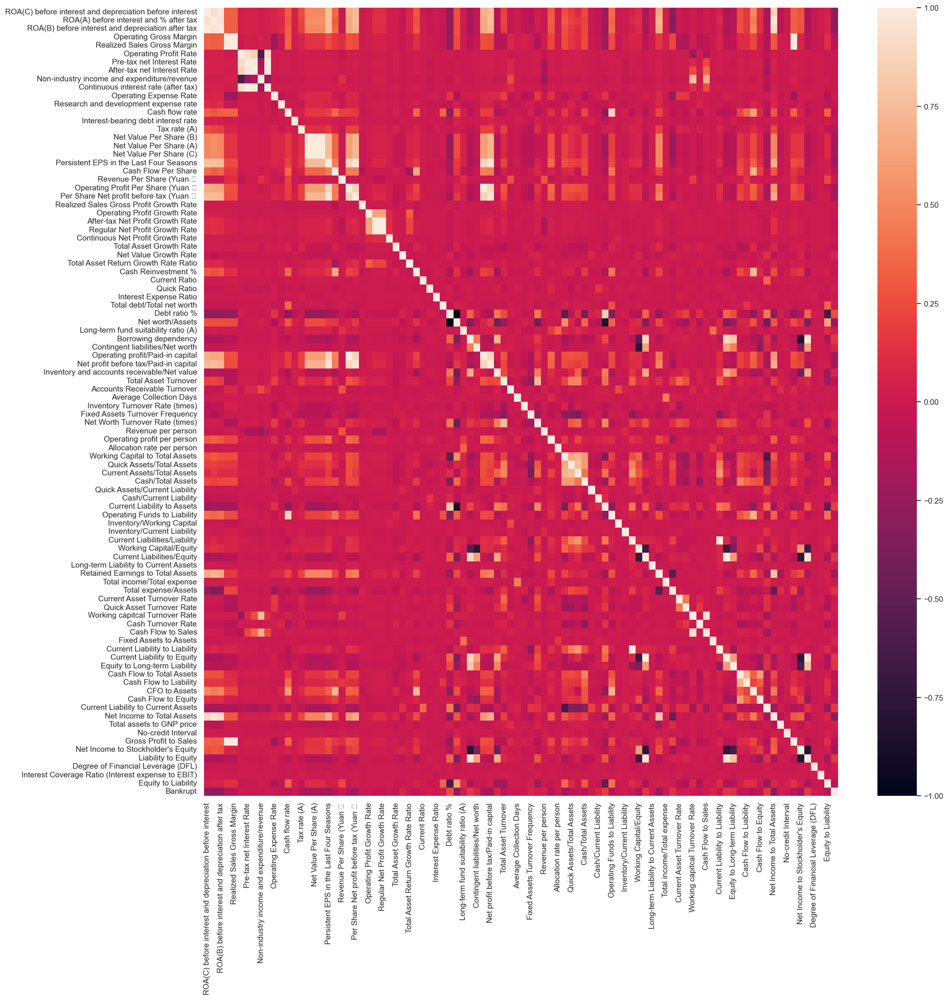

In [18]:
#plotting the correlation matrix as a heatmap
plt.figure(figsize=(20,20))
sns.heatmap(bank_df.corr())

## Observations:
    * All three ROAs (ROA(a), ROA(b) and ROA(c) are positively correlated amongst each other.
    * Net value per share A,B and C are also highly correlated between each other.
    * ' Debt ratio %', ' Net worth/Assets' are negatively correlated.
    * After tax net interest rate and pre tax net interets rate are also highely correlated.
    * ' Non-industry income and expenditure/revenue' is negatively correlated with Operating Profit Rate.
    * ' Operating Profit Growth Rate',' After-tax Net Profit Growth Rate' and ' Regular Net Profit Growth Rate' are also highely correlated.
    * Per Share Net profit before tax (Yuan ¥)' and ' Persistent EPS in the Last Four Seasons' are highely correlated.

In [19]:
# Lets remove highly the correlated columns
columns_corr =  ['ROA(C) before interest and depreciation before interest',
'ROA(B) before interest and depreciation after tax' ,'Net Value Per Share (B)',
'Net Value Per Share (A)' , 'Pre-tax net Interest Rate','Operating Profit Growth Rate', 
'After-tax Net Profit Growth Rate' , 'Per Share Net profit before tax (Yuan �']
bank_df = bank_df.drop(columns=columns_corr)

#As these are the feature that we had removed, These feature will contains same information, Thats why we had removed 
#some features

In [20]:
bank_df.columns

Index(['ROA(A) before interest and % after tax', 'Operating Gross Margin',
       'Realized Sales Gross Margin', 'Operating Profit Rate',
       'After-tax net Interest Rate',
       'Non-industry income and expenditure/revenue',
       'Continuous interest rate (after tax)', 'Operating Expense Rate',
       'Research and development expense rate', 'Cash flow rate',
       'Interest-bearing debt interest rate', 'Tax rate (A)',
       'Net Value Per Share (C)', 'Persistent EPS in the Last Four Seasons',
       'Cash Flow Per Share', 'Revenue Per Share (Yuan �',
       'Operating Profit Per Share (Yuan �',
       'Realized Sales Gross Profit Growth Rate',
       'Regular Net Profit Growth Rate', 'Continuous Net Profit Growth Rate',
       'Total Asset Growth Rate', 'Net Value Growth Rate',
       'Total Asset Return Growth Rate Ratio', 'Cash Reinvestment %',
       'Current Ratio', 'Quick Ratio', 'Interest Expense Ratio',
       'Total debt/Total net worth', 'Debt ratio %', 'Net worth/As

# Lets  plot and  analyse to understand the data

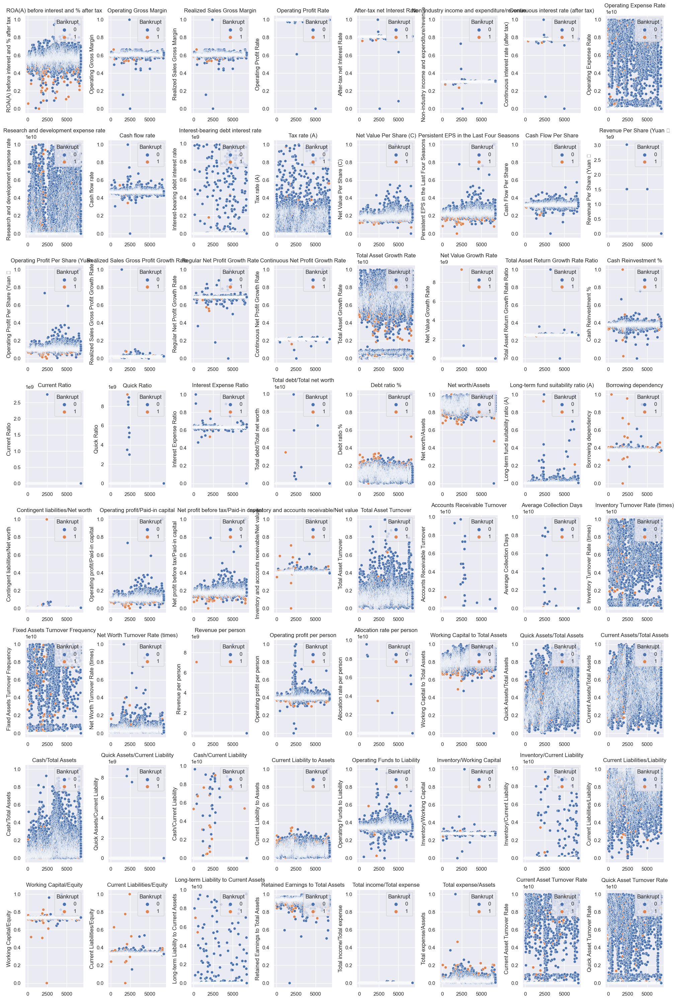

In [21]:
First_64 = bank_df.columns[:64]

#Execute in the loop to see all the 64 feature scatter plot with respect to Bankrupt
plt.figure(figsize=(20, 30))
for i, feature in enumerate(First_64, start=1):
    plt.subplot(8, 8, i)
    sns.scatterplot(x=bank_df.index, y=feature, hue='Bankrupt', data=bank_df)
    plt.title(feature)
    plt.legend(title='Bankrupt', loc='upper right')

plt.tight_layout()
plt.show()


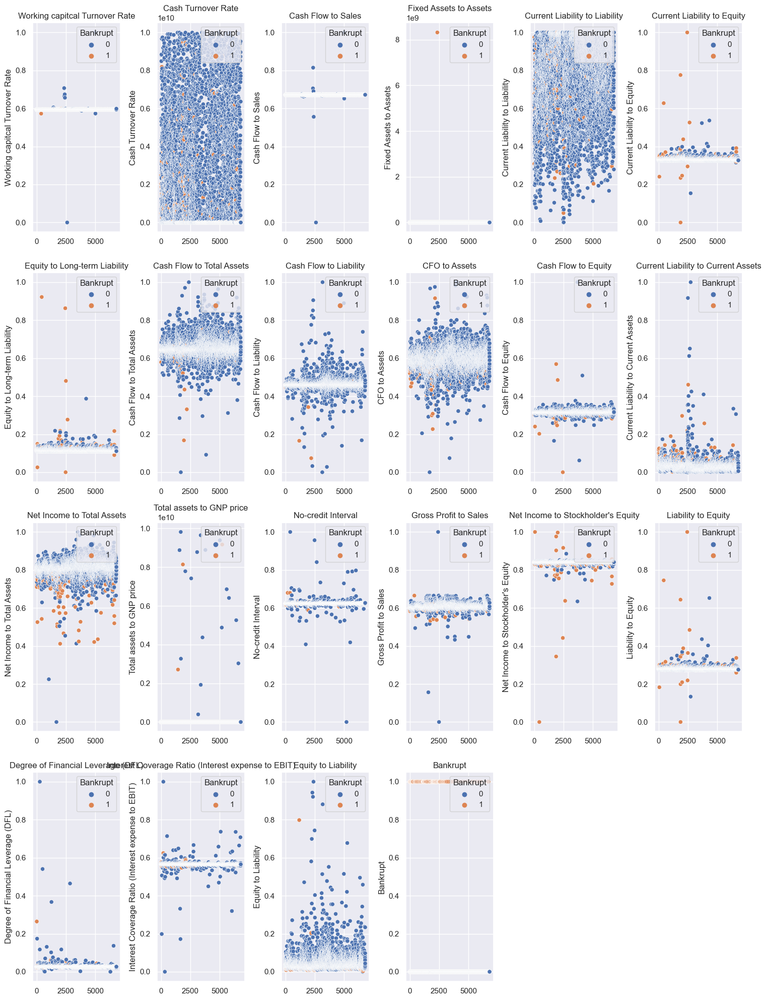

In [22]:
next_22 = bank_df.columns[64:86]
plt.figure(figsize=(15, 20))
for i, feature in enumerate(next_22, start=1):  # Start from 1 for the subplot index
    plt.subplot(4, 6, i)  # Adjust the subplot index
    sns.scatterplot(x=bank_df.index, y=feature, hue='Bankrupt', data=bank_df)
    plt.title(feature)
    plt.legend(title='Bankrupt', loc='upper right')
plt.tight_layout()
plt.show()



## Observation:
###### There seems to be a separation at around ROA (A) = 0.6
###### Higher values of Debt ratio have more tendency to lead to bankruptcy.
###### Lower values of net income to Total assets have more tendency to lead to bankruptcy.

# My Approch:
    Approch-1:
        Feature selection using RFE,Handled outliers and  used Smote to balance the data, Then create some models.
    Approch-2:
        The same DF from approch-1 is used but instead of oversampling I performed undersampling to balnce the data and
        created model
    Approach-3:
        As I can see lot of data in outliers,So I had decided to create a model along with feature selction and used Smote 
        to balnce the data,then created model
     Lets see which approach will give more accuracy of the model


# Approach-1:("RFE and SMOTE"):


### Feature selection by RFE method, Done some data exploration, Handle outliers and  used Smote to balance the the data, then we will create some model with this dataset and see the performanace


### We have a problem regarding the large number of features to choose from the dataset so we are going to use feature selection using the random forest classifier which is great for reducing computational load.

## Recursive feature elimination (RFE) 
         It is a feature selection process that suits a model and eliminates the weakest feature (or features) before the required number of features is achieved. Features are rated by the model's coef or feature importances attributes, and RFE aims to remove dependencies and collinearity by recursively deleting a small number of features per loop.

# Feature Selection Using RFE:

In [23]:
# training set for oversampling
x = bank_df.drop(columns=['Bankrupt'])
y = bank_df['Bankrupt']

# Lets split the dataset into train and test:

x_rfe_train, x_rfe_test, y_rfe_train, y_rfe_test = train_test_split(x, y, random_state=1)

In [24]:
# By determining list of features to select our model Approriate features that suits for this
n_features = [5, 10, 15, 20, 25]  # Tried with till 40 features also but 15 is the best
for i in n_features:
    # Building the model based feature selection
    model_rfe = RFE(RandomForestClassifier(n_estimators=100, random_state=42), n_features_to_select=i)
    model_rfe.fit(x_rfe_train, y_rfe_train)  
    train_rfe = model_rfe.transform(x_rfe_train)
    test_rfe = model_rfe.transform(x_rfe_test)

    score = RandomForestClassifier().fit(train_rfe, y_rfe_train).score(test_rfe, y_rfe_test)

    print("Test score is : {:.3f}".format(score), "The number of features is: {}".format(i))

Test score is : 0.962 The number of features is: 5
Test score is : 0.964 The number of features is: 10
Test score is : 0.964 The number of features is: 15
Test score is : 0.964 The number of features is: 20
Test score is : 0.964 The number of features is: 25


#### From above we can observe that  after adding 15 feature itself it is giving a constant test score, Test score is : 0.964 The number of features is: 15,  So I am taking 15 features is giving best in RFE

In [25]:
#Applying those 15 features and view those features,
model_rfe = RFE(RandomForestClassifier(n_estimators=100, random_state=42), n_features_to_select=15)
model_rfe.fit(x_rfe_train, y_rfe_train)
# Get the selected features names
selected_features = x_rfe_train.columns[model_rfe.get_support()]
# convert into the list of selected features
selected_features = list(selected_features) + ['Bankrupt'] # lets add our target variable to do some analysis
print("Selected Features:")
print(selected_features)


Selected Features:
['Interest-bearing debt interest rate', 'Net Value Per Share (C)', 'Persistent EPS in the Last Four Seasons', 'Net Value Growth Rate', 'Total debt/Total net worth', 'Borrowing dependency', 'Net profit before tax/Paid-in capital', 'Accounts Receivable Turnover', 'Allocation rate per person', 'Cash/Total Assets', 'Cash/Current Liability', 'Net Income to Total Assets', "Net Income to Stockholder's Equity", 'Degree of Financial Leverage (DFL)', 'Interest Coverage Ratio (Interest expense to EBIT)', 'Bankrupt']


In [26]:
# Updated dataset with only selected features from RFE
new_bank_df = bank_df[selected_features]
print(new_bank_df.shape)
new_bank_df.head()

(6819, 16)


,Interest-bearing debt interest rate,Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Net Value Growth Rate,Total debt/Total net worth,Borrowing dependency,Net profit before tax/Paid-in capital,Accounts Receivable Turnover,Allocation rate per person,Cash/Total Assets,Cash/Current Liability,Net Income to Total Assets,Net Income to Stockholder's Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Bankrupt
0,0.000725,0.147950,0.169141,0.000327,0.021266,0.390284,0.137757,0.001814,0.037135,0.004094,1.473360e-04,0.716845,0.827890,0.026601,0.564050,1
1,0.000647,0.182251,0.208944,0.000443,0.012502,0.376760,0.168962,0.001286,0.012335,0.014948,1.383910e-03,0.795297,0.839969,0.264577,0.570175,1
2,0.000790,0.193713,0.180581,0.000396,0.021248,0.379093,0.148036,0.001495,0.141016,0.000991,5.340000e+09,0.774670,0.836774,0.026555,0.563706,1
3,0.000449,0.154187,0.193722,0.000382,0.009572,0.379743,0.147561,0.001966,0.021320,0.018851,1.010646e-03,0.739555,0.834697,0.026697,0.564663,1
4,0.000686,0.167502,0.212537,0.000439,0.005150,0.375025,0.167461,0.001449,0.023988,0.014161,6.804640e-04,0.795016,0.839973,0.024752,0.575617,1


#   Plotting the selected features to explore more

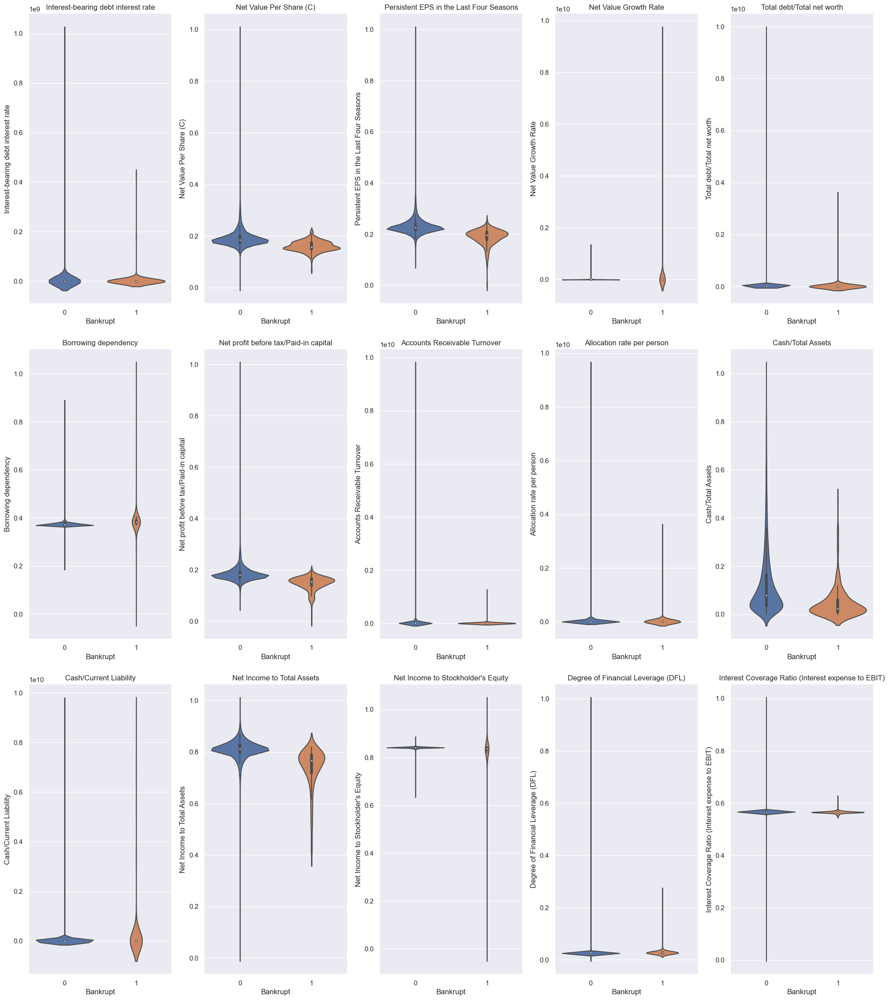

In [27]:
plt.figure(figsize=(20, 30))

# Loop all the selected features to plot
for index, col in enumerate(new_bank_df.columns, start=1):
    if col != 'Bankrupt':
        plt.subplot(4, 5, index)
        sns.violinplot(x='Bankrupt', y=col, data=new_bank_df)
        plt.title(col)
    
plt.tight_layout()
plt.show()


# Similarly using barplot

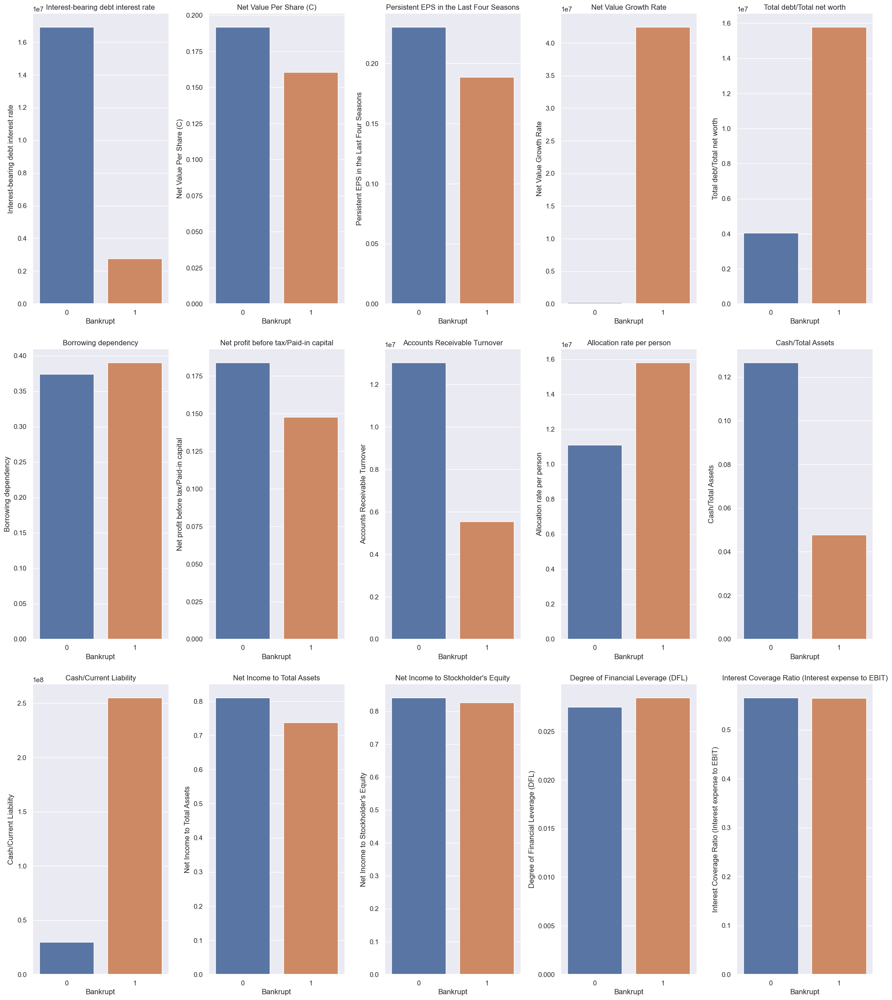

In [28]:
plt.figure(figsize=(20, 30))

# Loop through all the selected features to plot
for index, col in enumerate(new_bank_df.columns, start=1):
    if col != 'Bankrupt':  # Exclude the target variable
        plt.subplot(4, 5, index)
        sns.barplot(x='Bankrupt', y=col, data=new_bank_df, ci=None)
        plt.title(col)

plt.tight_layout()
plt.show()


In [29]:
# Removing Net Value Growth Rate as it is not giving any meaningful plots.
new_bank_df.drop(columns=['Net Value Growth Rate'], inplace=True)

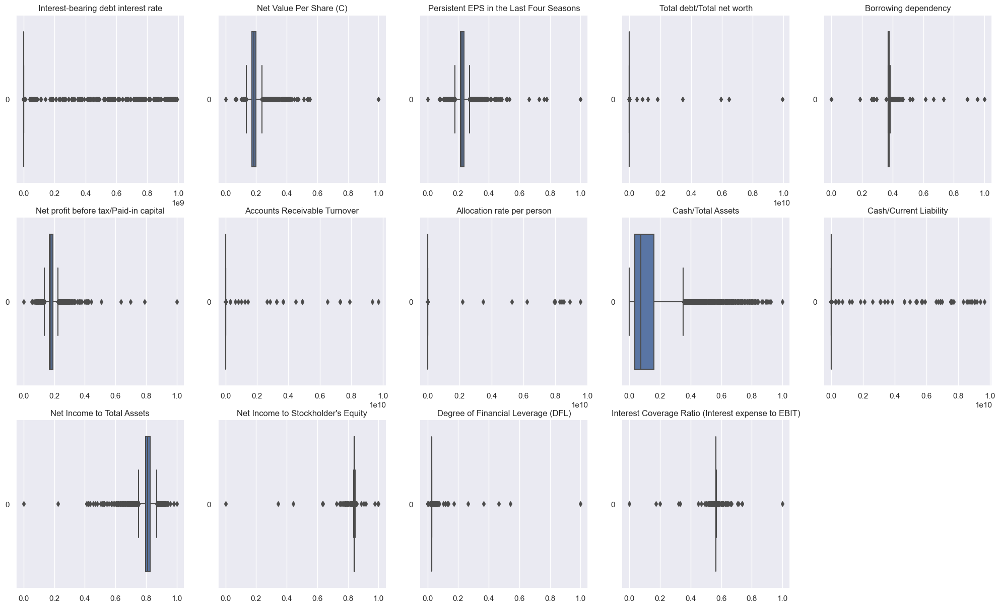

In [30]:
# Similarly lets plot the box plot to see the outliers
import numpy as np
import seaborn as sns
plt.figure(figsize=(25,20))
for index, col in enumerate(new_bank_df, start=1):
    if col != 'Bankrupt':
        plt.subplot(4,5,index)
        plt.title(col)
        ax = sns.boxplot(new_bank_df[col], orient='h')

In [31]:
# As we can see lot of outliers, Lets handle the handle the outliers

#  BIVARIATE/MULTIVARIATE ANALYSIS

<Axes: >

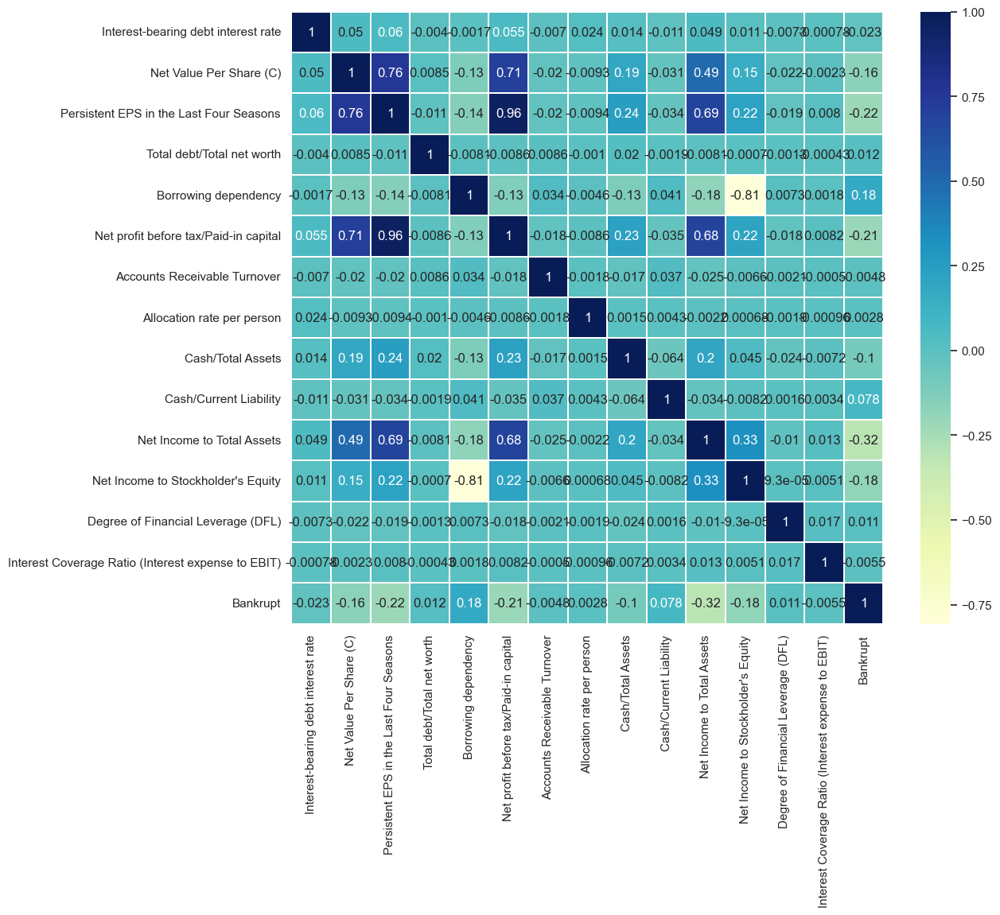

In [32]:
corrmat = new_bank_df.corr(method='pearson')
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corrmat, ax=ax, cmap="YlGnBu", linewidths=0.1, annot=True)

In [33]:
new_bank_df.columns

Index(['Interest-bearing debt interest rate', 'Net Value Per Share (C)',
       'Persistent EPS in the Last Four Seasons', 'Total debt/Total net worth',
       'Borrowing dependency', 'Net profit before tax/Paid-in capital',
       'Accounts Receivable Turnover', 'Allocation rate per person',
       'Cash/Total Assets', 'Cash/Current Liability',
       'Net Income to Total Assets', 'Net Income to Stockholder's Equity',
       'Degree of Financial Leverage (DFL)',
       'Interest Coverage Ratio (Interest expense to EBIT)', 'Bankrupt'],
      dtype='object')

In [34]:
# As we can see lot of data in outlier, our model may not predict well when we remove the outliers,
# So Will try to cap the outliers

In [35]:
def cap_outliers(series, iqr_threshold=1.5, method="IQR"):
    if method=="IQR":
        Q1 = series.quantile(0.25)
        Q3 = series.quantile(0.75)
        IQR = Q3 - Q1
        low_bound = Q1 - iqr_threshold * IQR
        up_bound = Q3 + iqr_threshold * IQR
        series = series.clip(lower=low_bound, upper=up_bound)
        print('\n'.join([
                f'Capping outliers for {series.name} by the IQR method:',
                f'   IQR threshold: {iqr_threshold}',
                f'   Lower bound: {low_bound}',
                f'   Upper bound: {up_bound}\n'
            ]))
    return series

remove_list = ['Bankrupt']
features = [col for col in new_bank_df.columns if col not in remove_list]
for col in features:
    new_bank_df[col] = cap_outliers(new_bank_df[col], method="IQR")


Capping outliers for Interest-bearing debt interest rate by the IQR method:
   IQR threshold: 1.5
   Lower bound: -0.0002912795000000001
   Upper bound: 0.0010268525000000001

Capping outliers for Net Value Per Share (C) by the IQR method:
   IQR threshold: 1.5
   Lower bound: 0.13477097474999994
   Upper bound: 0.23851712875000003

Capping outliers for Persistent EPS in the Last Four Seasons by the IQR method:
   IQR threshold: 1.5
   Lower bound: 0.17854779350000005
   Upper bound: 0.2749834535

Capping outliers for Total debt/Total net worth by the IQR method:
   IQR threshold: 1.5
   Lower bound: -0.006392316249999998
   Upper bound: 0.018672657749999995

Capping outliers for Borrowing dependency by the IQR method:
   IQR threshold: 1.5
   Lower bound: 0.3610135032499999
   Upper bound: 0.3854250772500001

Capping outliers for Net profit before tax/Paid-in capital by the IQR method:
   IQR threshold: 1.5
   Lower bound: 0.13603046550000003
   Upper bound: 0.22495286949999999

Cappi

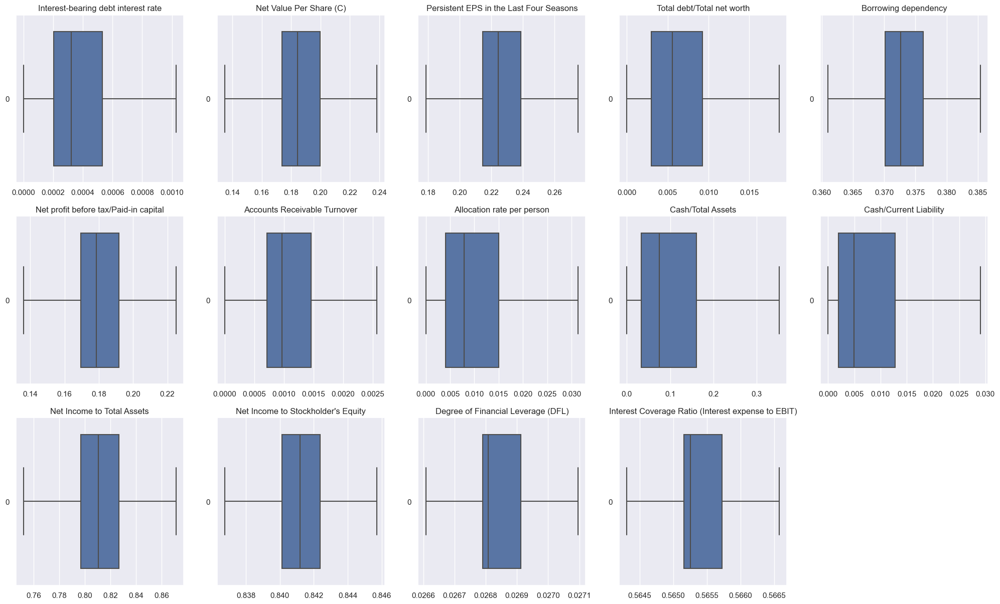

In [36]:
# Verification of Deleting Outliers
# Boxplot
plt.figure(figsize=(25,20))
for index, col in enumerate(new_bank_df, start=1):
    if col != 'Bankrupt':
        plt.subplot(4,5,index)
        plt.title(col)
        ax = sns.boxplot(new_bank_df[col], orient='h')

In [37]:
# From above we can see that outliers for the selected features are handled, Now all the values are in the range of IQR

In [38]:
print(len(new_bank_df[new_bank_df['Bankrupt']==1]))
new_bank_df.shape

220


(6819, 15)

In [39]:
# Lets split the data into x andd y, X will contain all the data except Target variable, Y will contain only Target variable column
x_rfe = new_bank_df.drop('Bankrupt',axis=1)
y_rfe = new_bank_df['Bankrupt']

In [40]:
# Imbalance treatement by SMOTE, lets check the values before and after Imbance treatment
smote = SMOTE()
x_smote, y_smote = smote.fit_resample(x_rfe,y_rfe)
print("Original value count :", y.value_counts())
print("*************SMOTE Method**********************")
print("After Smote value count :", y_smote.value_counts())

Original value count : Bankrupt
0    6599
1     220
Name: count, dtype: int64
*************SMOTE Method**********************
After Smote value count : Bankrupt
1    6599
0    6599
Name: count, dtype: int64


In [41]:
y_smote.shape

(13198,)

In [42]:
# Split the data into training and test
x_train, x_test, y_train, y_test = train_test_split(x_smote, y_smote, test_size=0.25, random_state=101)

In [43]:
x_test.shape

(3300, 14)

In [44]:
print("x_train shape is:", x_train.shape)
print("x_test shape is:", x_test.shape)

x_train shape is: (9898, 14)
x_test shape is: (3300, 14)


In [45]:
# Lets try to build a list of model and evaluate the performance, Which is giving correct prediction

In [46]:
# As this is the classification Problem Decission tree and Random forest will work better,
# But I am trying to build list of models with this dataset to understand better

In [47]:
var_models_smote = {
    "Logistic Regression": LogisticRegression(solver="liblinear", l1_ratio=0.4),
    "K-Nearest Neighbors": KNeighborsClassifier(weights='distance', metric='euclidean'),
    "Decision Tree": DecisionTreeClassifier(),
    "SVM (SVC)": SVC(probability=True),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(loss="exponential"),
    "AdaBoost Classifier": AdaBoostClassifier(n_estimators=60, learning_rate=0.2),
    "XGBoost Classifier": XGB.XGBClassifier(),
    "Gaussian Naive Bayes": GaussianNB(),
}

for name, model in var_models_smote.items():
    model.fit(x_train, y_train)
    print(name + ' was completed.')


Logistic Regression was completed.
K-Nearest Neighbors was completed.
Decision Tree was completed.
SVM (SVC) was completed.
Random Forest was completed.
Gradient Boosting was completed.
AdaBoost Classifier was completed.
XGBoost Classifier was completed.
Gaussian Naive Bayes was completed.


In [8]:
var = {
    "x":  12,"y":  31,
}

In [9]:
var(1)

TypeError: 'dict' object is not callable

In [48]:
# created a function to give classification report for each model created
def evaluation_report(y_true, y_pred, y_pred_proba):
    """
    This function prints evaluation metrics for a classification model.
        y_true: Actual labels.
        y_pred: Predicted labels.
        y_pred_proba: Predicted probabilities for positive class.
    """
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred))
    print("\nROC AUC Score:")
    print(roc_auc_score(y_true, y_pred_proba))
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_proba)
for name, model in var_models_smote.items():
    print('---------- ' + name + ' ----------')
    y_pred = model.predict(x_test)
    y_pred_proba = model.predict_proba(x_test)[:, 1]
    evaluation_report(y_test, y_pred, y_pred_proba)
    print()

---------- Logistic Regression ----------

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.81      0.84      1639
           1       0.83      0.89      0.86      1661

    accuracy                           0.85      3300
   macro avg       0.85      0.85      0.85      3300
weighted avg       0.85      0.85      0.85      3300


ROC AUC Score:
0.923396779067132

---------- K-Nearest Neighbors ----------

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.89      0.94      1639
           1       0.90      1.00      0.95      1661

    accuracy                           0.94      3300
   macro avg       0.95      0.94      0.94      3300
weighted avg       0.95      0.94      0.94      3300


ROC AUC Score:
0.9772276380327647

---------- Decision Tree ----------

Classification Report:
              precision    recall  f1-score   support

           0       0.97     

confusion_matrix For Test data:


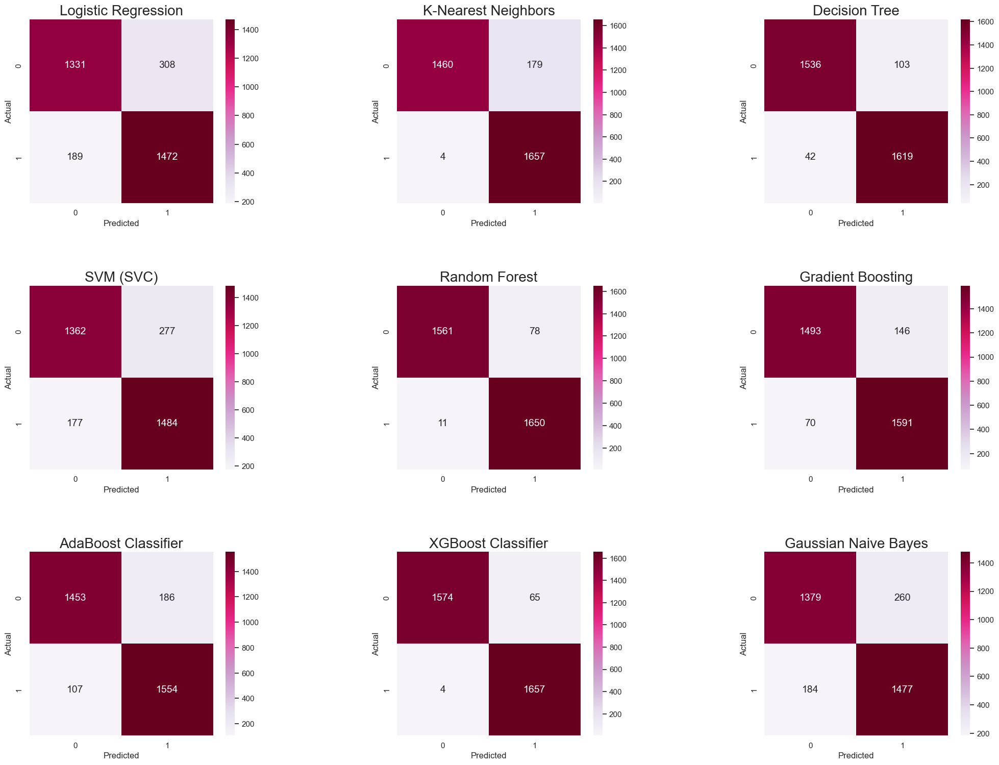

In [49]:
# Plotted a confussion matrix to see the predictions
fig = plt.figure(figsize=(25, 25))
start = 1
print("confusion_matrix For Test data:")
for name, model in var_models_smote.items():
    y_test_pred = model.predict(x_test)
    conf_mx = confusion_matrix(y_test, y_test_pred)

    heat_cm = pd.DataFrame(conf_mx, columns=np.unique(y_test), index=np.unique(y_test))
    heat_cm.index.name = 'Actual'
    heat_cm.columns.name = 'Predicted'

    plt.subplot(4, 3, start)
    fig.subplots_adjust(wspace=0.45, hspace=0.45)
    sns.heatmap(heat_cm, annot=True, fmt='d', square=True, annot_kws={"size": 14}, cmap='PuRd').set_title(name, fontsize=20)
    start += 1

plt.show()


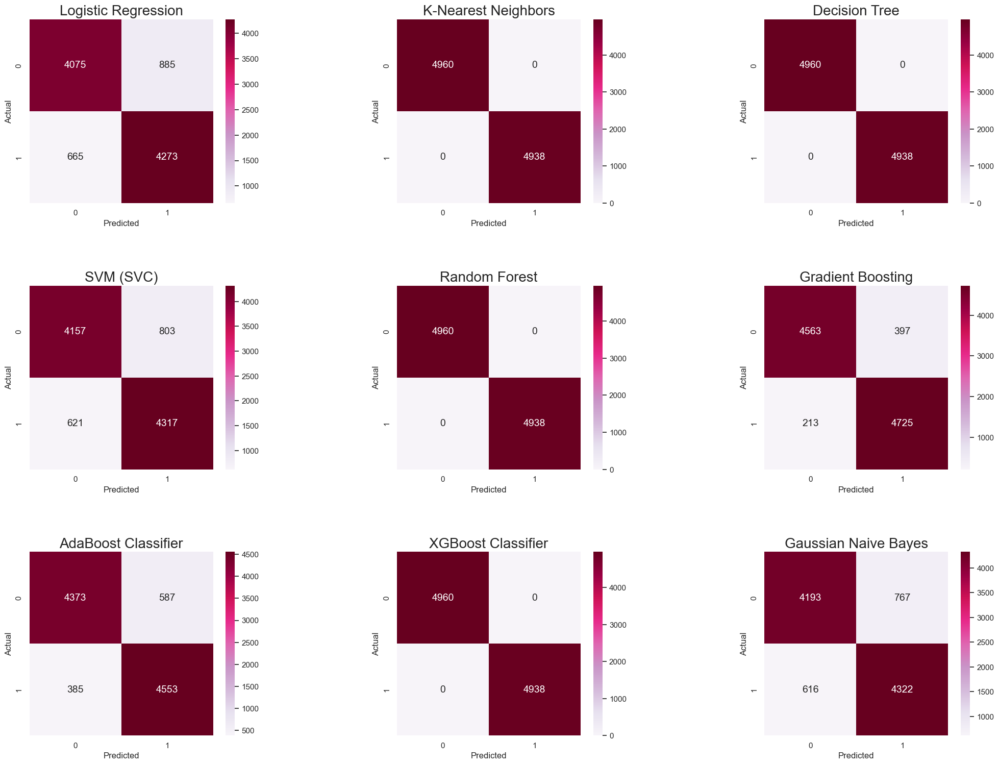

In [50]:
# Similarly for Train data
fig = plt.figure(figsize=(25, 25))
a = 1

for name, model in var_models_smote.items():
    y_test_pred = model.predict(x_train)
    conf_mx = confusion_matrix(y_train, y_test_pred)

    heat_cm = pd.DataFrame(conf_mx, columns=np.unique(y_test), index=np.unique(y_test))
    heat_cm.index.name = 'Actual'
    heat_cm.columns.name = 'Predicted'

    plt.subplot(4, 3, a)
    fig.subplots_adjust(wspace=0.45, hspace=0.45)
    sns.heatmap(heat_cm, annot=True, fmt='d', square=True, annot_kws={"size": 14}, cmap='PuRd').set_title(name, fontsize=20)
    a += 1

plt.show()


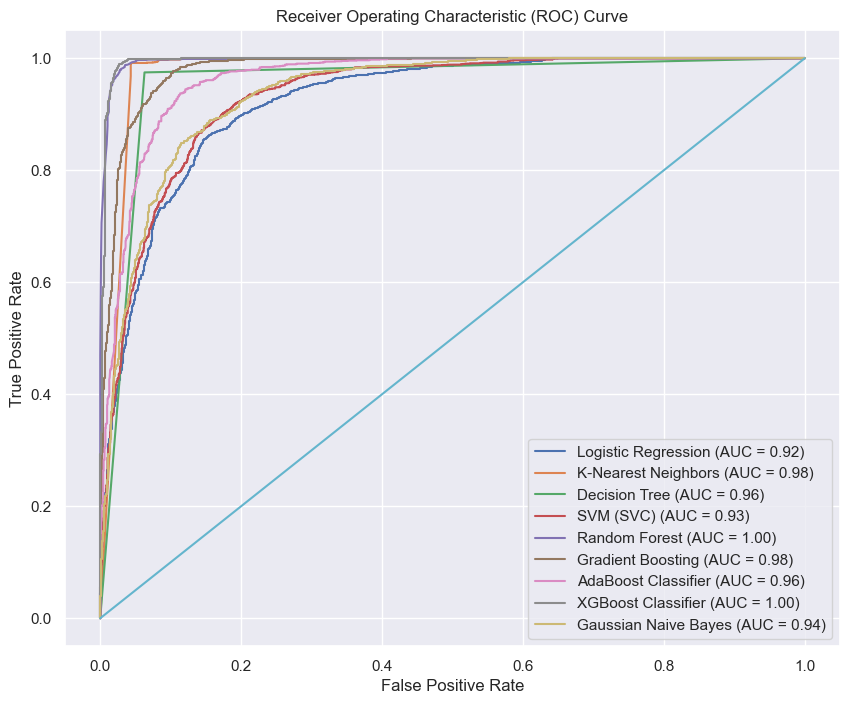

In [51]:
# Plotted the ROC curve to see which model is giving better rate
plt.figure(figsize=(10, 8))

# Plot ROC curve for each model
for name, model in var_models_smote.items():
    y_pred_proba = model.predict_proba(x_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    
plt.plot([0, 1], [0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()



# APPROACH-2:
##       undersampling

##### Here we are using the same dataset used for Approach-1, Only Instead of Using Smote we are using undersampling Technique

In [52]:
# Balance the dataset by undersampling
count_minority = new_bank_df['Bankrupt'].sum()  # Number of samples in minority class
df_minority = new_bank_df[new_bank_df['Bankrupt'] == 1]
df_majority = new_bank_df[new_bank_df['Bankrupt'] == 0]
undersampled_major = df_majority.sample(n=count_minority, random_state=42)
sampled_data = pd.concat([df_minority, undersampled_major], ignore_index=True)

In [53]:
# Split the sampled dataset into training and testing sets
x1 = sampled_data.drop('Bankrupt', axis=1)
y1 = sampled_data['Bankrupt']
x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, test_size=0.15, random_state=42, shuffle=True)

In [54]:
print("****shape of the dataset before undersampling****")
print(new_bank_df.shape)
print("****shape of the dataset After undersampling****")
print(sampled_data.shape)

****shape of the dataset before undersampling****
(6819, 15)
****shape of the dataset After undersampling****
(440, 15)


In [55]:
# In this 440 each class are spltted into half that is 220 for class-0 and 220 for class-1

In [56]:
print(f'DF under sampled shape: {sampled_data.shape}')
print(f'X1 train shape: {x1_train.shape}')
print(f'X1 test shape: {x1_test.shape}')

DF under sampled shape: (440, 15)
X1 train shape: (374, 14)
X1 test shape: (66, 14)


In [57]:
sampled_data['Bankrupt'].value_counts()

Bankrupt
1    220
0    220
Name: count, dtype: int64

<Axes: ylabel='count'>

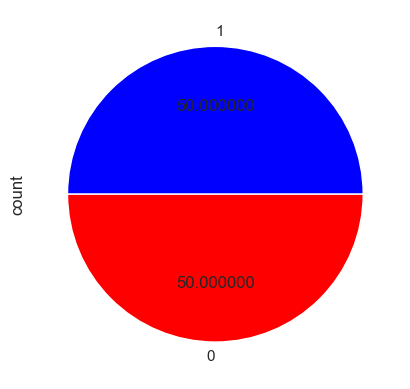

In [58]:
sampled_data['Bankrupt'].value_counts().plot.pie(autopct="%2f", colors=['blue', 'red'])

In [59]:
# By using undersampling now each class are having the same count

## Model building(approch-2):

In [60]:
var_models1 = {
    "K-Nearest Neighbors": KNeighborsClassifier(n_neighbors=10,weights='distance').fit(x1_train, y1_train),
    "Decision Tree": DecisionTreeClassifier(max_depth=40, criterion='entropy', min_samples_split=10).fit(x1_train,y1_train),
    "Support Vector Machine (LinearSVC)": SVC(C=100, kernel = 'rbf', probability=True).fit(x1_train, y1_train),
    "Random Forest": RandomForestClassifier(n_estimators=200, criterion='gini').fit(x1_train, y1_train),
}

for name, model in var_models1.items():
  model.fit(x1_train, y1_train)
  print(name + ' was completed.')

K-Nearest Neighbors was completed.
Decision Tree was completed.
Support Vector Machine (LinearSVC) was completed.
Random Forest was completed.


In [61]:
for name, model in var_models1.items():
    model.fit(x1_train, y1_train)
    y1_pred = model.predict(x1_test)
    report = classification_report(y1_test, y1_pred)
    print('-------------------------------------------')
    print(f"Classification Report for {name}:")
    print(report)
    print('-------------------------------------------')


-------------------------------------------
Classification Report for K-Nearest Neighbors:
              precision    recall  f1-score   support

           0       0.78      0.93      0.85        30
           1       0.93      0.78      0.85        36

    accuracy                           0.85        66
   macro avg       0.86      0.86      0.85        66
weighted avg       0.86      0.85      0.85        66

-------------------------------------------
-------------------------------------------
Classification Report for Decision Tree:
              precision    recall  f1-score   support

           0       0.79      0.90      0.84        30
           1       0.91      0.81      0.85        36

    accuracy                           0.85        66
   macro avg       0.85      0.85      0.85        66
weighted avg       0.86      0.85      0.85        66

-------------------------------------------
-------------------------------------------
Classification Report for Support Vect

confusion_matrix For Test data:


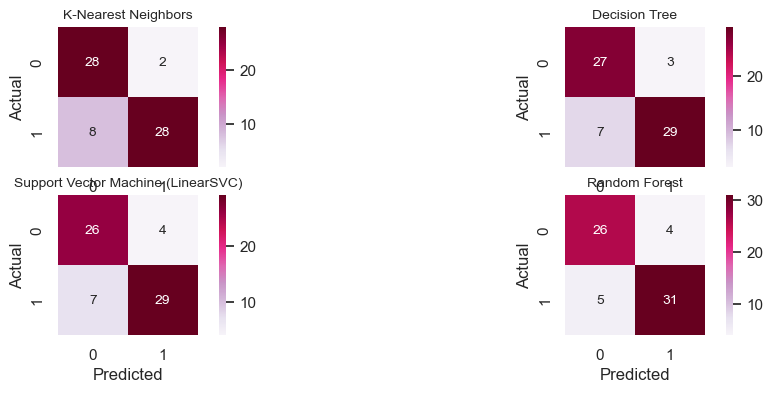

In [62]:
fig = plt.figure(figsize=(12, 4))
start = 1
print("confusion_matrix For Test data:")
for name, model in var_models1.items():
    y1_test_pred = model.predict(x1_test)
    conf_mx = confusion_matrix(y1_test, y1_test_pred)
    heat_cm = pd.DataFrame(conf_mx, columns=np.unique(y_test), index=np.unique(y1_test))
    heat_cm.index.name = 'Actual'
    heat_cm.columns.name = 'Predicted'
    plt.subplot(2, 2, start)
    sns.heatmap(heat_cm, annot=True, fmt='d', square=True, annot_kws={"size": 10}, cmap='PuRd').set_title(name, fontsize=10)
    start += 1

plt.show()

confusion_matrix For Train data:


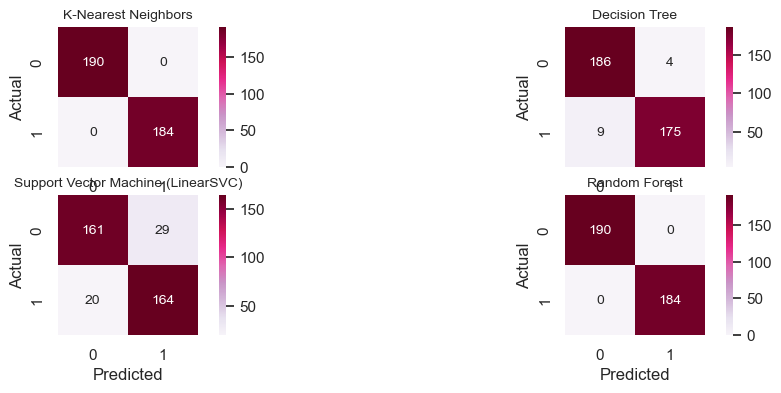

In [63]:
fig = plt.figure(figsize=(12, 4))
start = 1
print("confusion_matrix For Train data:")
for name, model in var_models1.items():
    y1_train_pred = model.predict(x1_train)
    conf_mx = confusion_matrix(y1_train, y1_train_pred)

    heat_cm = pd.DataFrame(conf_mx, columns=np.unique(y_train), index=np.unique(y1_test))
    heat_cm.index.name = 'Actual'
    heat_cm.columns.name = 'Predicted'

    plt.subplot(2, 2, start)
    sns.heatmap(heat_cm, annot=True, fmt='d', square=True, annot_kws={"size": 10}, cmap='PuRd').set_title(name, fontsize=10)
    start += 1

plt.show()

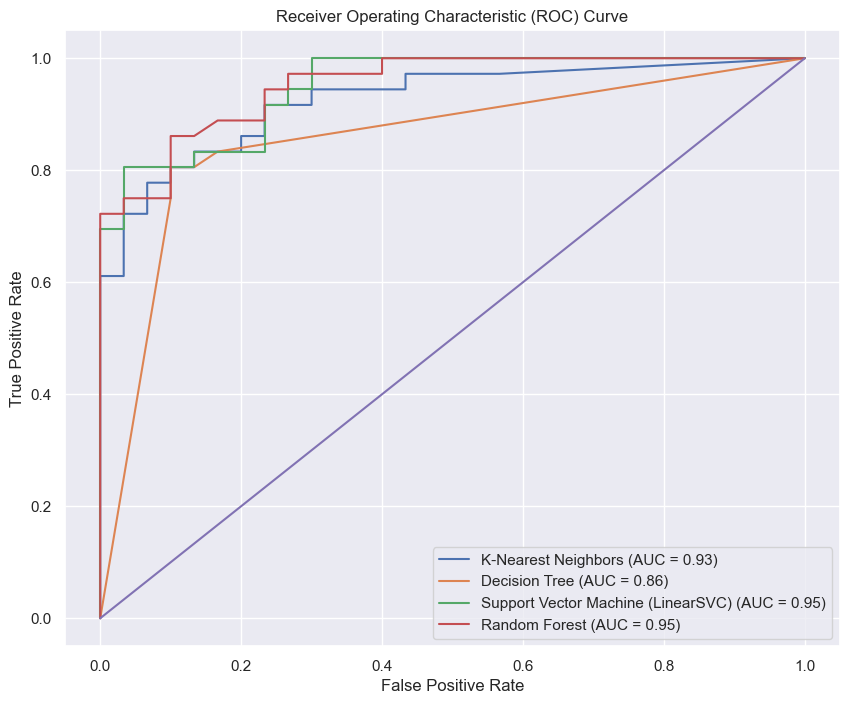

In [64]:
plt.figure(figsize=(10, 8))

# Plot ROC curve for each model
for name, model in var_models1.items():
    y1_pred_proba = model.predict_proba(x1_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y1_test, y1_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

# ROC center line
plt.plot([0, 1], [0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


Fold : 1
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.92      0.93        36
           1       0.93      0.95      0.94        39

    accuracy                           0.93        75
   macro avg       0.93      0.93      0.93        75
weighted avg       0.93      0.93      0.93        75



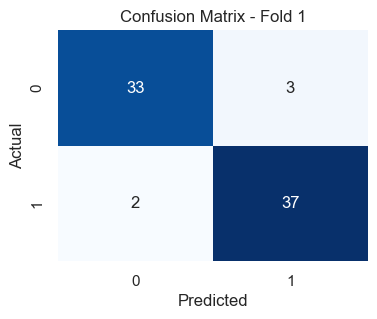

Fold : 2
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.85      0.90        39
           1       0.85      0.97      0.91        36

    accuracy                           0.91        75
   macro avg       0.91      0.91      0.91        75
weighted avg       0.91      0.91      0.91        75



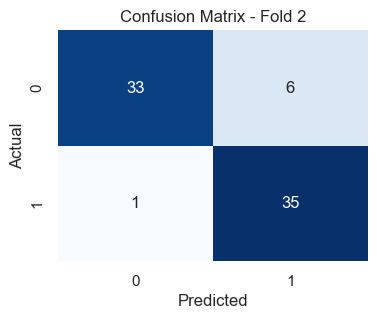

Fold : 3
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.81      0.82        42
           1       0.76      0.79      0.78        33

    accuracy                           0.80        75
   macro avg       0.80      0.80      0.80        75
weighted avg       0.80      0.80      0.80        75



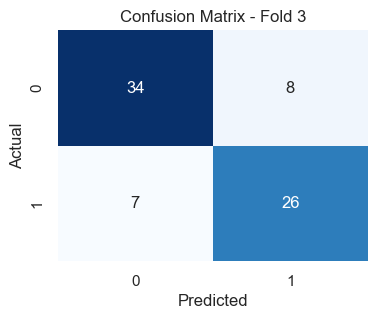

Fold : 4
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.84      0.86        37
           1       0.85      0.89      0.87        38

    accuracy                           0.87        75
   macro avg       0.87      0.87      0.87        75
weighted avg       0.87      0.87      0.87        75



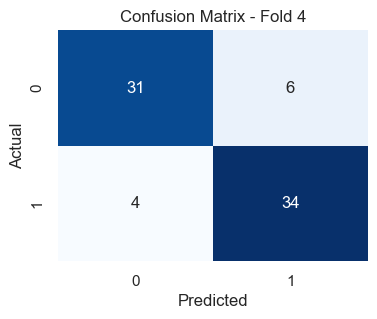

Fold : 5
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.83      0.87        36
           1       0.85      0.92      0.89        38

    accuracy                           0.88        74
   macro avg       0.88      0.88      0.88        74
weighted avg       0.88      0.88      0.88        74



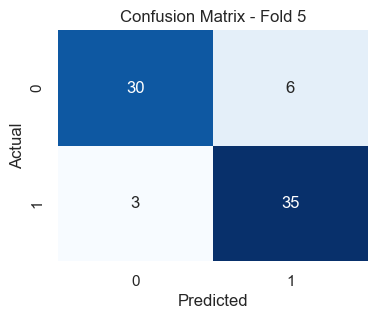

In [65]:
kf = KFold(5, shuffle=True)

fold = 1 #initializing a count of folds
for training, val in kf.split(x1_train, y1_train):
    # Random Forest classifier
    rf = RandomForestClassifier(n_estimators=200, criterion='gini')
    rf.fit(x1_train.iloc[training], y1_train.iloc[training])
    y1_pred = rf.predict(x1_train.iloc[val])
    # classification report
    classification_rep = classification_report(y1_train.iloc[val], y1_pred)
    
    #confusion matrix
    con_mat = confusion_matrix(y1_train.iloc[val], y1_pred)
    
    # Print fold information
    print('=================================')
    print(f"Fold : {fold}")
    print('=================================')
    print("Classification Report:")
    print(classification_rep)
    
    plt.figure(figsize=(4, 3))
    sns.heatmap(con_mat, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.title(f"Confusion Matrix - Fold {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()
    
    fold += 1


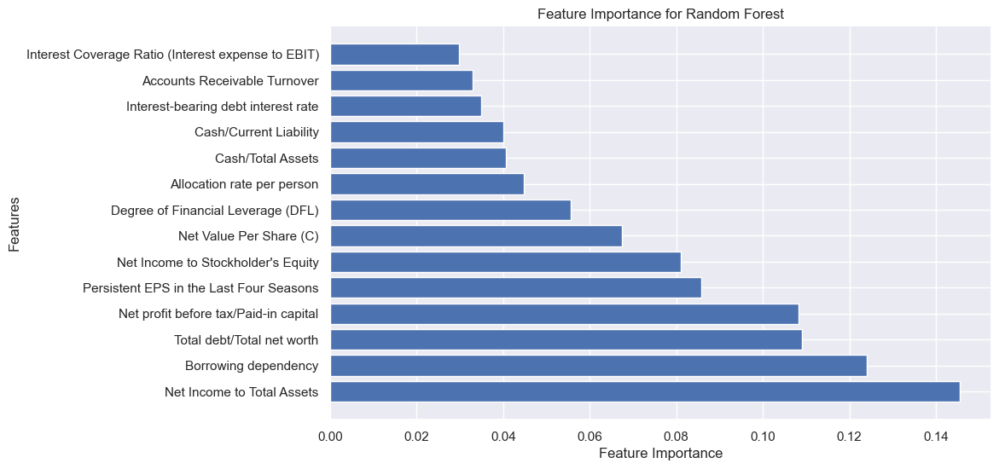

In [66]:
rf_model = var_models1["Random Forest"]

# Get feature importances and corresponding  names
importances = rf_model.feature_importances_
feature_names = x1_train.columns

# Sort the feature importances
sorted_indices = importances.argsort()[::-1]
sorted_importances = importances[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plotting feature importance
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_importances)), sorted_importances, align='center')
plt.yticks(range(len(sorted_importances)), sorted_feature_names)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance for Random Forest')
plt.show()


# APPROACH-3:
##    Feature scaling along with model building + smote

In [67]:
bank_df.shape

(6819, 86)

In [68]:
x2 = bank_df.drop(columns=['Bankrupt'])
y2 = bank_df['Bankrupt']
# Scaling all the features in the dataset.
# Tried without Scaling but there is slight change in model performance
scaler = StandardScaler()
x2_scaled = scaler.fit_transform(x2)
x2 = pd.DataFrame(x2_scaled, columns=x2.columns)

In [69]:
x2.columns

Index(['ROA(A) before interest and % after tax', 'Operating Gross Margin',
       'Realized Sales Gross Margin', 'Operating Profit Rate',
       'After-tax net Interest Rate',
       'Non-industry income and expenditure/revenue',
       'Continuous interest rate (after tax)', 'Operating Expense Rate',
       'Research and development expense rate', 'Cash flow rate',
       'Interest-bearing debt interest rate', 'Tax rate (A)',
       'Net Value Per Share (C)', 'Persistent EPS in the Last Four Seasons',
       'Cash Flow Per Share', 'Revenue Per Share (Yuan �',
       'Operating Profit Per Share (Yuan �',
       'Realized Sales Gross Profit Growth Rate',
       'Regular Net Profit Growth Rate', 'Continuous Net Profit Growth Rate',
       'Total Asset Growth Rate', 'Net Value Growth Rate',
       'Total Asset Return Growth Rate Ratio', 'Cash Reinvestment %',
       'Current Ratio', 'Quick Ratio', 'Interest Expense Ratio',
       'Total debt/Total net worth', 'Debt ratio %', 'Net worth/As

# Feature scaling with Random forest

In [70]:
# Feature Engineering method along with model building
rf_lable = RandomForestClassifier()
rf_lable.fit(x2, y2)
df1 = pd.DataFrame({"Feature": x2.columns, "RF_importance": rf_lable.feature_importances_}).sort_values(by='RF_importance', ascending=False)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
df1

,Feature,RF_importance
13,Persistent EPS in the Last Four Seasons,0.035653
34,Net profit before tax/Paid-in capital,0.032701
31,Borrowing dependency,0.032580
80,Net Income to Stockholder's Equity,0.032466
76,Net Income to Total Assets,0.026790
26,Interest Expense Ratio,0.025530
12,Net Value Per Share (C),0.025131
48,Cash/Total Assets,0.023267
28,Debt ratio %,0.022598
82,Degree of Financial Leverage (DFL),0.022060


In [71]:
# Filter features with importance greater than 0 
important_features_list_df1 = df1[df1['RF_importance'] == 0]['Feature'].tolist()
print(important_features_list_df1)


['Fixed Assets to Assets', 'Revenue Per Share (Yuan �', 'Quick Assets/Current Liability', 'Allocation rate per person', 'Average Collection Days', 'Accounts Receivable Turnover', 'Current Ratio']


# Feature Engineering method with GB

In [72]:
GB_lable = GradientBoostingClassifier()
GB_lable.fit(x2, y2)
df2 = pd.DataFrame({"Feature": x2.columns, "GB_importance": GB_lable.feature_importances_}).sort_values(by='GB_importance', ascending=False)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
df2

,Feature,GB_importance
80,Net Income to Stockholder's Equity,0.143826
13,Persistent EPS in the Last Four Seasons,0.076166
48,Cash/Total Assets,0.066918
31,Borrowing dependency,0.065072
82,Degree of Financial Leverage (DFL),0.056099
83,Interest Coverage Ratio (Interest expense to EBIT),0.047068
34,Net profit before tax/Paid-in capital,0.039629
6,Continuous interest rate (after tax),0.032107
12,Net Value Per Share (C),0.031582
22,Total Asset Return Growth Rate Ratio,0.027700


In [73]:
# Filter the features with importance greater than 0
important_features_list_df2 = df2[df2['GB_importance'] == 0]['Feature'].tolist()
print(important_features_list_df2)

['Total assets to GNP price', 'After-tax net Interest Rate', 'Cash Flow to Equity', 'Net Value Growth Rate', 'Fixed Assets to Assets', 'Interest-bearing debt interest rate', 'Long-term Liability to Current Assets', 'Current Liabilities/Equity', 'Tax rate (A)', 'Inventory/Current Liability', 'Cash/Current Liability', 'Quick Assets/Current Liability', 'Revenue Per Share (Yuan �', 'Allocation rate per person', 'Average Collection Days', 'Accounts Receivable Turnover', 'Quick Ratio', 'Current Ratio', 'Revenue per person']


In [74]:
len(important_features_list_df2)

19

# Feature Engineering method along with Decission Tree

In [75]:
dt_lable = DecisionTreeClassifier()
dt_lable.fit(x2, y2)
df3 = pd.DataFrame({"Feature": x2.columns, "dt_importance": dt_lable.feature_importances_}).sort_values(by='dt_importance', ascending=False)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
df3

,Feature,dt_importance
80,Net Income to Stockholder's Equity,0.137705
6,Continuous interest rate (after tax),0.056577
34,Net profit before tax/Paid-in capital,0.044785
83,Interest Coverage Ratio (Interest expense to EBIT),0.041672
22,Total Asset Return Growth Rate Ratio,0.040748
76,Net Income to Total Assets,0.040390
65,Cash Turnover Rate,0.039624
31,Borrowing dependency,0.035859
20,Total Asset Growth Rate,0.029914
26,Interest Expense Ratio,0.028239


In [76]:
# Filter features with importance greater than 0 
important_features_list_df3 = df3[df3['dt_importance'] == 0]['Feature'].tolist()
print(important_features_list_df3)

['Fixed Assets to Assets', 'Cash Flow to Total Assets', 'CFO to Assets', 'Total assets to GNP price', 'ROA(A) before interest and % after tax', 'Revenue per person', 'Current Asset Turnover Rate', 'Total debt/Total net worth', 'Operating Profit Rate', 'Interest-bearing debt interest rate', 'Revenue Per Share (Yuan �', 'Regular Net Profit Growth Rate', 'Net Value Growth Rate', 'Current Ratio', 'Quick Ratio', 'Debt ratio %', 'Long-term Liability to Current Assets', 'Total Asset Turnover', 'Accounts Receivable Turnover', 'Average Collection Days', 'Allocation rate per person', 'Quick Assets/Current Liability', 'Cash/Current Liability', 'Inventory/Current Liability', 'Equity to Liability']


In [77]:
len(important_features_list_df3)

25

In [78]:
# Converting list into set to find common elements
set_df2 = set(important_features_list_df2)
set_df3 = set(important_features_list_df3)
# Finding common elements among sets-2 and sets-3
common_features2_3 = set_df2.intersection(set_df3)
common_features2_3

{'Accounts Receivable Turnover',
 'Allocation rate per person',
 'Average Collection Days',
 'Cash/Current Liability',
 'Current Ratio',
 'Fixed Assets to Assets',
 'Interest-bearing debt interest rate',
 'Inventory/Current Liability',
 'Long-term Liability to Current Assets',
 'Net Value Growth Rate',
 'Quick Assets/Current Liability',
 'Quick Ratio',
 'Revenue Per Share (Yuan �',
 'Revenue per person',
 'Total assets to GNP price'}

In [79]:
set_df1 = set(important_features_list_df1)
# Finding common elements with set_df2 and set_df3 with respect to df1
common_features1_2_3 = set_df1.intersection(set_df2, set_df3)
print(common_features1_2_3)

{'Quick Assets/Current Liability', 'Accounts Receivable Turnover', 'Fixed Assets to Assets', 'Allocation rate per person', 'Current Ratio', 'Revenue Per Share (Yuan �', 'Average Collection Days'}


In [80]:
len(common_features2_3)

15

In [81]:
# Dropping the features that are having values 0
x2 = x2.drop(['Accounts Receivable Turnover',
 'Allocation rate per person',
 'Average Collection Days',
 'Cash/Current Liability',
 'Current Liability to Equity',
 'Current Ratio',
 'Fixed Assets to Assets',
 'Interest-bearing debt interest rate',
 'Inventory/Current Liability',
 'Long-term Liability to Current Assets',
 'Net Value Growth Rate',
 'Quick Assets/Current Liability',
 'Quick Ratio',
 'Revenue Per Share (Yuan �',
 'Revenue per person',
 'Total assets to GNP price',
 'After-tax net Interest Rate', 'Total Asset Turnover','Current Liabilities/Equity', 'Operating Gross Margin', 
              'Total debt/Total net worth', 'Current Asset Turnover Rate', 'Operating profit/Paid-in capital',
              'Operating profit per person', 'Cash Flow to Total Assets', 'Debt ratio %'
              
             ], axis =1)

In [82]:
x2.shape

(6819, 59)

## Imbalance treatment by SMOTE

In [83]:
# Imbalance treatement
smote = SMOTE()
x2_smote, y2_smote = smote.fit_resample(x2, y2)
print("Original value count :", y2.value_counts())
print("*************SMOTE Method**********************")
print("After Smote value count :", y2_smote.value_counts())

Original value count : Bankrupt
0    6599
1     220
Name: count, dtype: int64
*************SMOTE Method**********************
After Smote value count : Bankrupt
1    6599
0    6599
Name: count, dtype: int64


In [84]:
#Splitting the data into train and test
x2_train, x2_test, y2_train, y2_test = train_test_split(x2_smote, y2_smote, test_size=0.25, random_state=101,stratify=y_smote)

# Model Building with Approach-3

------------------------------------------------------------
*************classification_report for Testing*************
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1650
           1       0.97      0.99      0.98      1650

    accuracy                           0.98      3300
   macro avg       0.98      0.98      0.98      3300
weighted avg       0.98      0.98      0.98      3300

*************classification_report for Training *************
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4949
           1       1.00      1.00      1.00      4949

    accuracy                           1.00      9898
   macro avg       1.00      1.00      1.00      9898
weighted avg       1.00      1.00      1.00      9898

------------------------------------------------------------
*************accuracy_score for Testing*************
0.9803030303030303
*************accuracy_score fo

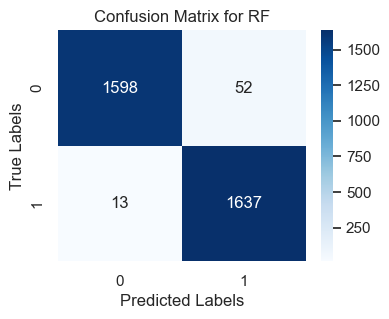

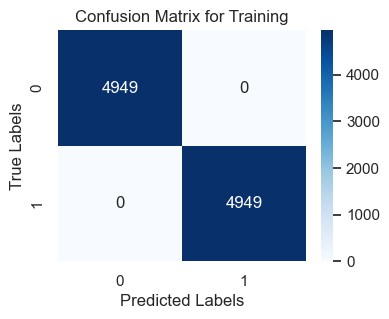

In [85]:
# RandomForest Classifier
from sklearn.metrics import accuracy_score
rf_1 = RandomForestClassifier()
rf_1.fit(x2_train, y2_train)
y2_pred_train_rf = rf_1.predict(x2_train)
y2_pred_test_rf = rf_1.predict(x2_test)

print("------------------------------------------------------------")
print("*************classification_report for Testing*************")
print(classification_report(y2_test, y2_pred_test_rf))
print("*************classification_report for Training *************")
print(classification_report(y2_train, y2_pred_train_rf))

print("------------------------------------------------------------")
print("*************accuracy_score for Testing*************")
print(accuracy_score(y2_test, y2_pred_test_rf))
print("*************accuracy_score for Training************")
print(accuracy_score(y2_train, y2_pred_train_rf))
print("------------------------------------------------------------")

# Confusion matrix for testing data
test_con_rf = confusion_matrix(y2_test, y2_pred_test_rf)
plt.figure(figsize=(4, 3))
sns.heatmap(test_con_rf, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix for RF")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()
# Confusion matrix for training data
train_con_rf = confusion_matrix(y2_train, y2_pred_train_rf)
plt.figure(figsize=(4,3))
sns.heatmap(train_con_rf, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix for Training")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [86]:
# Tried with hyper parameter tuning in  random forest also
# param_dist = {
#     'max_depth': [20],
#     'bootstrap': [True],
#     'max_features': ['sqrt'],
#     'criterion': ['entropy']
# }

In [87]:

# cv_rf.fit(x2_train, y2_train)
# best_rf = cv_rf.best_estimator_
# y_pred_test = best_rf.predict(x2_test)

# print("*************classification_report for Testing*************")
# print(classification_report(y2_test, y_pred_test))

# print("*************accuracy_score for Testing*************")
# print(accuracy_score(y2_test, y_pred_test))

#  testing data
# test_con_mat = confusion_matrix(y2_test, y_pred_test)
# plt.figure(figsize=(5, 4))
# sns.heatmap(test_con_mat, annot=True, fmt="d", cmap="Blues")
# plt.title("Confusion Matrix for Testing Data")
# plt.xlabel("Predicted Labels")
# plt.ylabel("True Labels")
# plt.show()


### Checking with cross validation method for RF

In [88]:
# CrossValidation method
training_accuracy_rf = cross_val_score(rf, x2_train, y2_train, cv=10)
print('training_accuracy mean for RF is :' , training_accuracy_rf.mean())
print("********************")
print('training_accuracy max for RF is:' , training_accuracy_rf.max())

training_accuracy mean for RF is : 0.9775714679658056
********************
training_accuracy max for RF is: 0.9878787878787879


# XGBoost Classifier

------------------------------------------------------------
*************classification_report for testing*************
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1650
           1       0.97      0.99      0.98      1650

    accuracy                           0.98      3300
   macro avg       0.98      0.98      0.98      3300
weighted avg       0.98      0.98      0.98      3300

*************classification_report for training*************
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4949
           1       1.00      1.00      1.00      4949

    accuracy                           1.00      9898
   macro avg       1.00      1.00      1.00      9898
weighted avg       1.00      1.00      1.00      9898

------------------------------------------------------------
*************accuracy_score for testing*************
0.9833333333333333
*************accuracy_score for

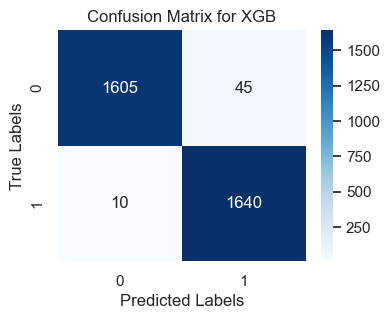

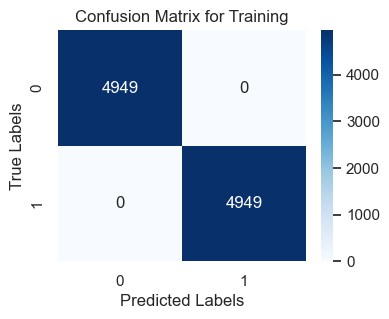

In [89]:
xgb = XGBClassifier()
xgb.fit(x2_train, y2_train)
y2_pred_train_xgb = xgb.predict(x2_train)
y2_pred_test_xgb = xgb.predict(x2_test)

print("------------------------------------------------------------")
print("*************classification_report for testing*************")
print(classification_report(y2_test, y2_pred_test_xgb))
print("*************classification_report for training*************")
print(classification_report(y2_train, y2_pred_train_xgb))
print("------------------------------------------------------------")

print("*************accuracy_score for testing*************")
print(accuracy_score(y2_test, y2_pred_test_xgb))
print("*************accuracy_score for traing*************")
print(accuracy_score(y2_train, y2_pred_train_xgb))
print("------------------------------------------------------------")

# Confusion matrix for testing data
test_con_mat = confusion_matrix(y2_test, y2_pred_test_xgb)
plt.figure(figsize=(4, 3))
sns.heatmap(test_con_mat, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix for XGB")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Confusion matrix for training data
train_con_mat = confusion_matrix(y2_train, y2_pred_train_xgb)
plt.figure(figsize=(4,3))
sns.heatmap(train_con_mat, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix for Training")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

#  CrossValidation method with XGB

In [90]:
training_accuracy_xgb = cross_val_score(xgb, x2_train, y2_train, cv=10)
print('training_accuracy mean for xgb is :' , training_accuracy_xgb.mean())
print("********************")
print('training_accuracy max for xgb is:' , training_accuracy_xgb.max())

training_accuracy mean for xgb is : 0.9848456251085169
********************
training_accuracy max for xgb is: 0.9888888888888889


# Decission Tree:

------------------------------------------------------------
*************classification_report for Testing*************
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      1650
           1       0.94      0.96      0.95      1650

    accuracy                           0.95      3300
   macro avg       0.95      0.95      0.95      3300
weighted avg       0.95      0.95      0.95      3300

*************classification_report for Training *************
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4949
           1       0.99      0.99      0.99      4949

    accuracy                           0.99      9898
   macro avg       0.99      0.99      0.99      9898
weighted avg       0.99      0.99      0.99      9898

------------------------------------------------------------
*************accuracy_score for Testing*************
0.9487878787878787
*************accuracy_score fo

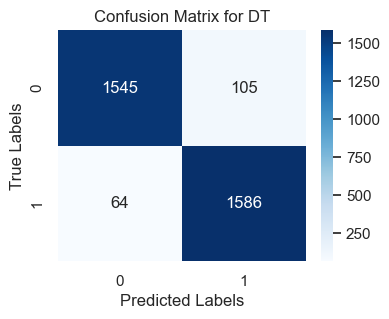

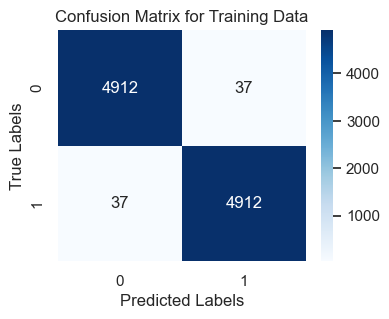

In [91]:
DT =  DecisionTreeClassifier(max_depth=40, criterion='entropy', min_samples_split=10).fit(x2_train,y2_train)
DT.fit(x2_train, y2_train)
y2_pred_train_DT = DT.predict(x2_train)
y2_pred_test_DT = DT.predict(x2_test)

print("------------------------------------------------------------")
print("*************classification_report for Testing*************")
print(classification_report(y2_test, y2_pred_test_DT))
print("*************classification_report for Training *************")
print(classification_report(y2_train, y2_pred_train_DT))
print("------------------------------------------------------------")

print("*************accuracy_score for Testing*************")
print(accuracy_score(y2_test, y2_pred_test_DT))
print("*************accuracy_score for Training************")
print(accuracy_score(y2_train, y2_pred_train_DT))
print("------------------------------------------------------------")

# Confusion matrix for testing data
test_con_mat = confusion_matrix(y2_test, y2_pred_test_DT)
plt.figure(figsize=(4, 3))
sns.heatmap(test_con_mat, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix for DT")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Confusion matrix for training data
train_con_mat = confusion_matrix(y2_train, y2_pred_train_DT)
plt.figure(figsize=(4,3))
sns.heatmap(train_con_mat, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix for Training Data")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Support Vector Machine (SVM)

------------------------------------------------------------
*************classification_report for Testing*************
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1650
           1       0.97      0.99      0.98      1650

    accuracy                           0.98      3300
   macro avg       0.98      0.98      0.98      3300
weighted avg       0.98      0.98      0.98      3300

*************classification_report for Training *************
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      4949
           1       0.99      1.00      1.00      4949

    accuracy                           1.00      9898
   macro avg       1.00      1.00      1.00      9898
weighted avg       1.00      1.00      1.00      9898

------------------------------------------------------------
*************accuracy_score for Testing*************
0.9796969696969697
*************accuracy_score fo

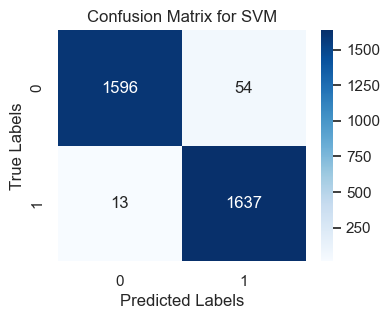

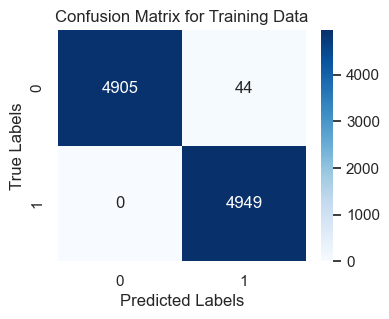

In [92]:
svm =  SVC(C=100, kernel = 'rbf', probability=True).fit(x2_train, y2_train)
svm.fit(x2_train, y2_train)
y2_pred_train_svm = svm.predict(x2_train)
y2_pred_test_svm = svm.predict(x2_test)

# Evaluation matrix
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
print("------------------------------------------------------------")
print("*************classification_report for Testing*************")
print(classification_report(y2_test, y2_pred_test_svm))
print("*************classification_report for Training *************")
print(classification_report(y2_train, y2_pred_train_svm))
print("------------------------------------------------------------")

print("*************accuracy_score for Testing*************")
print(accuracy_score(y2_test, y2_pred_test_svm))
print("*************accuracy_score for Training************")
print(accuracy_score(y2_train, y2_pred_train_svm))
print("------------------------------------------------------------")

# Confusion matrix for testing data
test_con_mat = confusion_matrix(y2_test, y2_pred_test_svm)
plt.figure(figsize=(4, 3))
sns.heatmap(test_con_mat, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix for SVM")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Confusion matrix for training data
train_con_mat = confusion_matrix(y2_train, y2_pred_train_svm)
plt.figure(figsize=(4,3))
sns.heatmap(train_con_mat, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix for Training Data")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

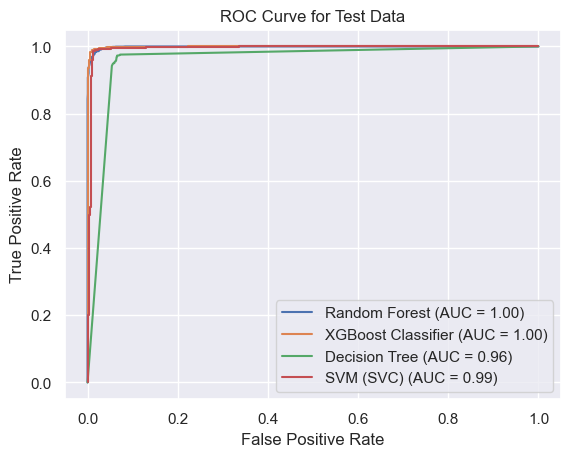

In [93]:
classifiers = {
    "Random Forest": rf_1,
    "XGBoost Classifier": xgb,
    "Decision Tree": DT,
    "SVM (SVC)": svm
}
for name, clf in classifiers.items():
    y_pred_test = clf.predict_proba(x2_test)[:, 1]
    fpr_test, tpr_test, _ = roc_curve(y2_test, y_pred_test)
    roc_auc_test = auc(fpr_test, tpr_test)
    plt.plot(fpr_test, tpr_test, label=f'{name} (AUC = {roc_auc_test:.2f})')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Test Data')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

# Feature Importance for the Approach-3

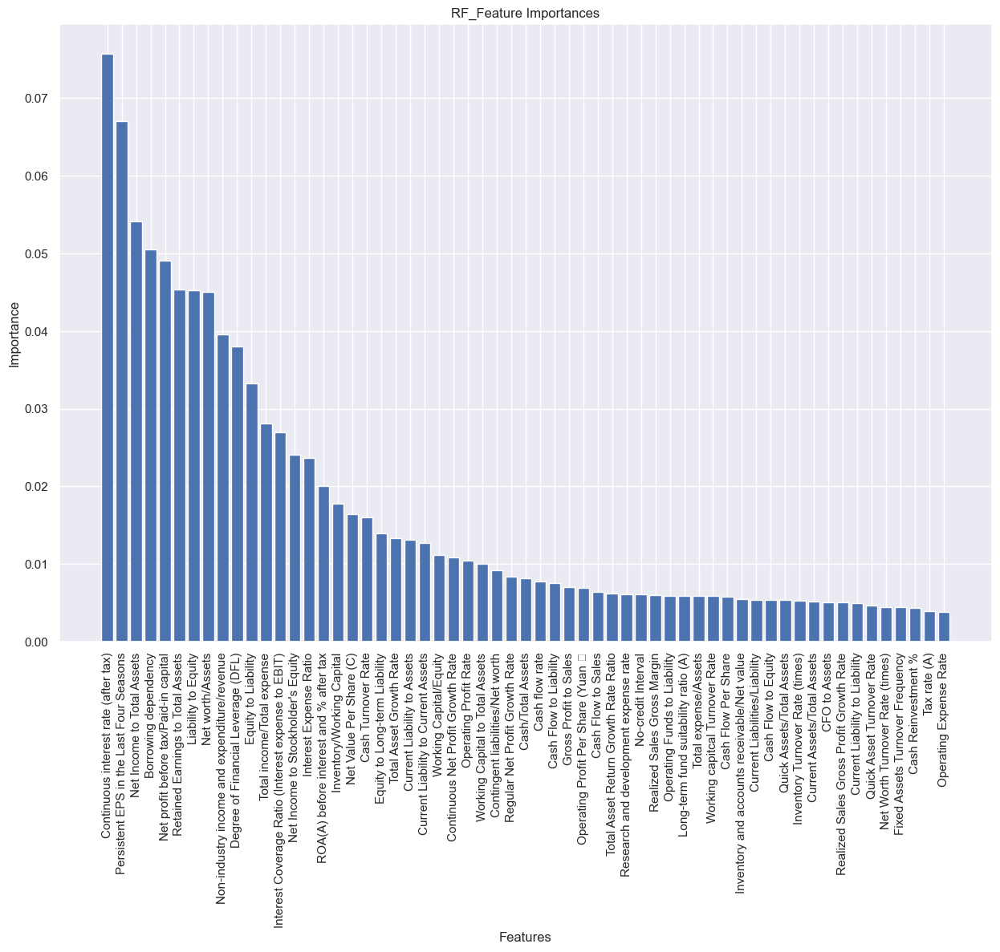

In [94]:
# Get feature importances
importances = rf_1.feature_importances_

# Get feature names
feature_names = x2.columns

# Sort feature importances in descending order
sort_ind = importances.argsort()[::-1]
sort_imp = importances[sort_ind]
sort_feature = feature_names[sort_ind]

# Plot feature importances
plt.figure(figsize=(15, 10))
plt.bar(range(x2.shape[1]), sort_imp, tick_label=sort_feature)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('RF_Feature Importances')
plt.show()

# Deep Learning Method - MultiLayer Perceptron method

In [95]:
import tensorflow as tf
from tensorflow import keras
from keras.layers import *
from keras import Sequential

In [96]:
model = Sequential()
model.add(Dense(32, input_shape=(59,), activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(x2_train, y2_train, batch_size=32, epochs=100, validation_data=(x2_test, y2_test))

Epoch 1/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7973 - loss: 0.4356 - val_accuracy: 0.9088 - val_loss: 0.2445
Epoch 2/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9163 - loss: 0.2227 - val_accuracy: 0.9233 - val_loss: 0.2123
Epoch 3/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9352 - loss: 0.1788 - val_accuracy: 0.9418 - val_loss: 0.1755
Epoch 4/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9466 - loss: 0.1577 - val_accuracy: 0.9482 - val_loss: 0.1545
Epoch 5/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9594 - loss: 0.1282 - val_accuracy: 0.9536 - val_loss: 0.1404
Epoch 6/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9664 - loss: 0.1112 - val_accuracy: 0.9570 - val_loss: 0.1323
Epoch 7/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9684 - loss: 0.1041 - val_accuracy: 0.9633 - val_loss: 0.1158
Epoch 8/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9730 - loss: 0.0917 - val_accu

310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9995 - loss: 0.0032 - val_accuracy: 0.9882 - val_loss: 0.0687
Epoch 52/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9997 - loss: 0.0026 - val_accuracy: 0.9855 - val_loss: 0.0771
Epoch 53/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9954 - loss: 0.0186 - val_accuracy: 0.9855 - val_loss: 0.0903
Epoch 54/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.9888 - val_loss: 0.0583
Epoch 55/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.9870 - val_loss: 0.0733
Epoch 56/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.9873 - val_loss: 0.0837
Epoch 57/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9998 - loss: 0.0017 - val_accuracy: 0.9885 - val_loss: 0.0733
Epoch 58/100
310/310 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9998 - loss: 0.0017 - val_accuracy:

## Deep learning method gives best results, But we dont need to implement this for this simple binary classification,
If we are not satisified by the previous ML model results, we can go for deep learning method

# Summary

# Approach-1(Overall_Result):

In [97]:
model_metrics = {
    "Logistic Regression": {"Precision": 0.84, "Recall": 0.81, "F1-score": 0.83, "ROC AUC Score": 0.9108},
    "K-Nearest Neighbors": {"Precision": 1.00, "Recall": 0.89, "F1-score": 0.94, "ROC AUC Score": 0.9776},
    "Decision Tree": {"Precision": 0.95, "Recall": 0.93, "F1-score": 0.94, "ROC AUC Score": 0.9451},
    "SVM (SVC)": {"Precision": 0.85, "Recall": 0.83, "F1-score": 0.84, "ROC AUC Score": 0.9236},
    "Random Forest": {"Precision": 1.00, "Recall": 0.95, "F1-score": 0.98, "ROC AUC Score": 0.9959},
    "Gradient Boosting": {"Precision": 0.95, "Recall": 0.91, "F1-score": 0.93, "ROC AUC Score": 0.9789},
    "AdaBoost Classifier": {"Precision": 0.91, "Recall": 0.88, "F1-score": 0.89, "ROC AUC Score": 0.9603},
    "XGBoost Classifier": {"Precision": 1.00, "Recall": 0.96, "F1-score": 0.98, "ROC AUC Score": 0.9965},
    "Gaussian Naive Bayes": {"Precision": 0.85, "Recall": 0.84, "F1-score": 0.84, "ROC AUC Score": 0.9284}}

app_1 = pd.DataFrame.from_dict(model_metrics, orient='index')
display(app_1)

,Precision,Recall,F1-score,ROC AUC Score
Logistic Regression,0.84,0.81,0.83,0.9108
K-Nearest Neighbors,1.00,0.89,0.94,0.9776
Decision Tree,0.95,0.93,0.94,0.9451
SVM (SVC),0.85,0.83,0.84,0.9236
Random Forest,1.00,0.95,0.98,0.9959
Gradient Boosting,0.95,0.91,0.93,0.9789
AdaBoost Classifier,0.91,0.88,0.89,0.9603
XGBoost Classifier,1.00,0.96,0.98,0.9965
Gaussian Naive Bayes,0.85,0.84,0.84,0.9284


# Approach-2(Overall_Result):

In [98]:
metrics_2 = {"K-Nearest Neighbors": { "Precision": 0.85,"Recall": 0.85,"F1-score": 0.85},
             "Decision Tree"      : {"Precision": 0.85,"Recall": 0.85,"F1-score": 0.85},
             "Support Vector Machine (LinearSVC)": {"Precision": 0.83,"Recall": 0.83,"F1-score": 0.83},
             "Random Forest": {"Precision": 0.86,"Recall": 0.86,"F1-score": 0.86}}

app_2 = pd.DataFrame.from_dict(metrics_2, orient='index')
display(app_2)


,Precision,Recall,F1-score
K-Nearest Neighbors,0.85,0.85,0.85
Decision Tree,0.85,0.85,0.85
Support Vector Machine (LinearSVC),0.83,0.83,0.83
Random Forest,0.86,0.86,0.86


# Approach-3(Overall_Result):

In [10]:
metrics_3 = { 
    "Random Forest Test": {"Precision": 0.98,"Recall": 0.98,"F1-score": 0.98,"Accuracy": 0.98},
    "XGBoost Test": {"Precision": 0.98,"Recall": 0.98,"F1-score": 0.98,"Accuracy": 0.98},
    "Decision Tree Test": {"Precision": 0.95,"Recall": 0.95,"F1-score": 0.95,"Accuracy": 0.95},
    "SVM Test": {"Precision": 0.98,"Recall": 0.98,"F1-score": 0.98,"Accuracy": 0.98}}

app_3 = pd.DataFrame.from_dict(metrics_3, orient='index')
display(app_3)


NameError: name 'pd' is not defined

In [11]:
import pandas as pd

In [12]:
metrics_3 = { 
    "Random Forest Test": {"Precision": 0.98,"Recall": 0.98,"F1-score": 0.98,"Accuracy": 0.98},
    "XGBoost Test": {"Precision": 0.98,"Recall": 0.98,"F1-score": 0.98,"Accuracy": 0.98},
    "Decision Tree Test": {"Precision": 0.95,"Recall": 0.95,"F1-score": 0.95,"Accuracy": 0.95},
    "SVM Test": {"Precision": 0.98,"Recall": 0.98,"F1-score": 0.98,"Accuracy": 0.98}}

app_3 = pd.DataFrame.from_dict(metrics_3, orient='index')
display(app_3)

,Precision,Recall,F1-score,Accuracy
Random Forest Test,0.98,0.98,0.98,0.98
XGBoost Test,0.98,0.98,0.98,0.98
Decision Tree Test,0.95,0.95,0.95,0.95
SVM Test,0.98,0.98,0.98,0.98


In [13]:
app_3

KeyError: 1